### 1. Importing the libraries


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "svg"

### 2. . Importing the dataset

In [2]:
raw_df=pd.read_csv("zomato.csv")#,delimiter='|'

In [3]:
raw_df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


### 3. Getting Basic Information about the Dataset

In [4]:
raw_df.shape

(51717, 17)

In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
url                            51717 non-null object
address                        51717 non-null object
name                           51717 non-null object
online_order                   51717 non-null object
book_table                     51717 non-null object
rate                           43942 non-null object
votes                          51717 non-null int64
phone                          50509 non-null object
location                       51696 non-null object
rest_type                      51490 non-null object
dish_liked                     23639 non-null object
cuisines                       51672 non-null object
approx_cost(for two people)    51371 non-null object
reviews_list                   51717 non-null object
menu_item                      51717 non-null object
listed_in(type)                51717 non-null object
listed_in(city)                51717 non-nul

In [6]:
raw_df.describe()

,votes
count,51717.000000
mean,283.697527
std,803.838853
min,0.000000
25%,7.000000
50%,41.000000
75%,198.000000
max,16832.000000


### 4. Cleaning the Dataset

a. Removing the redundunt rows of data

In [7]:
## Performing Negation of the wrong dataset and then storing the correct data back in the raw_df DataFrame
## This permamnently remove the wrong data from the original dataframe

#raw_df = raw_df[~wrong_data]

In [8]:
# Dropping columns which are not required for further analysis

raw_df.drop(['url','listed_in(city)'], axis = 1, inplace=True)


In [9]:

raw_df.head()


,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type)
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet


# b. Removing the Null Records

In [10]:
raw_df.isnull().sum()

address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
dtype: int64

In [11]:
# Checking for a null row
raw_df[raw_df['approx_cost(for two people)'].isnull()]


,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type)
1662,"6, Abbiah Layout KC Halli Main Road, Bommanaha...",Papa Khan Rasoi,No,No,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,[],[],Delivery
1768,"45, 14th Main, 7th phase, Puttehahalli Palya, ...",Innate,No,No,NaN,0,NaN,JP Nagar,Delivery,NaN,Beverages,NaN,[],[],Delivery
1795,"8/3, Opposite Suryadhoya Convention hall, Bann...",Super Chef's (New Royal treat),No,No,NaN,0,NaN,Bannerghatta Road,Quick Bites,NaN,"North Indian, Chinese, South Indian",NaN,"[('Rated 1.0', 'RATED\n Many items were missi...",[],Delivery
3069,"8/3, Opposite Suryadhoya Convention hall, Bann...",Super Chef's (New Royal treat),No,No,-,0,NaN,Bannerghatta Road,Quick Bites,NaN,"North Indian, Chinese, South Indian",NaN,"[('Rated 1.0', 'RATED\n Many items were missi...",[],Delivery
3774,"Ibis Bengaluru, Opposite RMZ Ecospace Business...",The Hub - Ibis Bengaluru,No,No,3.9/5,237,NaN,Marathahalli,Bar,"Dal Makhani, Cocktails, Lunch Buffet, Breakfas...",Finger Food,NaN,"[('Rated 4.0', 'RATED\n The Hub is a small ba...",[],Buffet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50940,"Ground Floor, The Forum Neighborhood Mall, Pre...",Cinnabon,No,No,4.0 /5,80,NaN,Whitefield,Quick Bites,"Rolls, Cinnamon Roll, Cinnamon Bun","Beverages, American, Bakery",NaN,"[('Rated 4.0', ""RATED\n Who else is a Cinnabo...",[],Desserts
51233,"43/9, Borewell Rd, Palm Meadows, Nallurhalli, ...",Mayas kitchen,No,No,NaN,0,NaN,Whitefield,Casual Dining,NaN,"South Indian, Chinese, Chettinad",NaN,"[('Rated 4.0', ""RATED\n Food was pretty good,...",[],Dine-out
51247,"D64, 33, 1st Floor, Sundari Armadale, Next To ...",Mast Kalandar,No,No,2.6 /5,76,NaN,Whitefield,Casual Dining,"Gulab Jamun, Lassi, Dal Makhani, Buttermilk, T...",North Indian,NaN,"[('Rated 1.0', 'RATED\n Terrible food in this...",[],Dine-out
51271,"N254-107, 1st Main Road, Near ITPL Gate 3, KIA...",Karavalli Food Court,No,No,3.2 /5,4,NaN,Whitefield,Casual Dining,NaN,South Indian,NaN,"[('Rated 1.0', 'RATED\n i was a regular custo...",[],Dine-out


In [12]:
# Droping the above row from the dataset
raw_df = raw_df.drop(labels=15080, axis=0)

In [13]:
# Replacing the other null records with NA 
raw_df.fillna('NA', inplace=True)

In [14]:
raw_df.isnull().sum()

address                        0
name                           0
online_order                   0
book_table                     0
rate                           0
votes                          0
phone                          0
location                       0
rest_type                      0
dish_liked                     0
cuisines                       0
approx_cost(for two people)    0
reviews_list                   0
menu_item                      0
listed_in(type)                0
dtype: int64

### c. Converting the DataTypes of numerical columns to numeric data type

In [15]:
# Checking for text values in the column before converting it to numeric datatype
raw_df['rate'].value_counts()


NA        7775
NEW       2208
3.9/5     2098
3.8/5     2021
3.7/5     2011
          ... 
2.0 /5       7
2.2 /5       7
2.0/5        4
1.8 /5       3
1.8/5        2
Name: rate, Length: 65, dtype: int64

In [16]:
#Replacing the text values with '0'
raw_df['rate'].replace(to_replace=['-','NEW','Opening'], value='0', inplace=True)

In [17]:
# Checking for text values in the column before converting it to numeric datatype
raw_df['votes'].value_counts()

0       10027
4        1140
6         992
7         872
9         738
        ...  
1735        1
1590        1
1351        1
3334        1
2353        1
Name: votes, Length: 2328, dtype: int64

In [18]:
# Checking for text values in the column before converting it to numeric datatype
raw_df['approx_cost(for two people)'].value_counts()

300      7576
400      6562
500      4980
200      4857
600      3714
         ... 
560         1
5,000       1
469         1
160         1
3,700       1
Name: approx_cost(for two people), Length: 71, dtype: int64

In [19]:
#Replacing the text values with '0'
raw_df['votes'].replace(to_replace=['-','NEW','Opening'], value='0', inplace=True)

In [20]:
raw_df['votes'] = raw_df['votes'].astype('int64')

# Convert 'rate' column to float64
def clean_rate(value):
    if '/' in value:
        parts = value.split('/')
        if len(parts) >= 2:
            return float(parts[0])
    try:
        return float(value)
    except ValueError:
        return None  # or another value to indicate missing data

raw_df['rate'] = raw_df['rate'].apply(clean_rate)



In [21]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51716 entries, 0 to 51716
Data columns (total 15 columns):
address                        51716 non-null object
name                           51716 non-null object
online_order                   51716 non-null object
book_table                     51716 non-null object
rate                           43941 non-null float64
votes                          51716 non-null int64
phone                          51716 non-null object
location                       51716 non-null object
rest_type                      51716 non-null object
dish_liked                     51716 non-null object
cuisines                       51716 non-null object
approx_cost(for two people)    51716 non-null object
reviews_list                   51716 non-null object
menu_item                      51716 non-null object
listed_in(type)                51716 non-null object
dtypes: float64(1), int64(1), object(13)
memory usage: 6.3+ MB


### d. Working with 'Timing' column

In [22]:
# Checking for Null records in DAYS_OPEN column
raw_df.isnull().sum()

address                           0
name                              0
online_order                      0
book_table                        0
rate                           7775
votes                             0
phone                             0
location                          0
rest_type                         0
dish_liked                        0
cuisines                          0
approx_cost(for two people)       0
reviews_list                      0
menu_item                         0
listed_in(type)                   0
dtype: int64

In [23]:

# Replacing the Null values with 'NA'
raw_df.fillna('NA', inplace=True)


In [24]:
# Checking info of all the columns
raw_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 51716 entries, 0 to 51716
Data columns (total 15 columns):
address                        51716 non-null object
name                           51716 non-null object
online_order                   51716 non-null object
book_table                     51716 non-null object
rate                           51716 non-null object
votes                          51716 non-null int64
phone                          51716 non-null object
location                       51716 non-null object
rest_type                      51716 non-null object
dish_liked                     51716 non-null object
cuisines                       51716 non-null object
approx_cost(for two people)    51716 non-null object
reviews_list                   51716 non-null object
menu_item                      51716 non-null object
listed_in(type)                51716 non-null object
dtypes: int64(1), object(14)
memory usage: 6.3+ MB


# e. Removing the restaurant records whose Rating or Votes is 0

In [25]:

# Finding those restaurant whose has 0 Rating or Votes
useless_data = (raw_df['rate'] == 0.0) | (raw_df['votes'] == 0)
raw_df[useless_data]


,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type)
72,"Opposite ICICi Bank, Hanuman Nagar, Banashanka...",Spicy Tandoor,No,No,0,0,+91 8050884222,Banashankari,Quick Bites,NA,North Indian,150,"[('Rated 4.0', 'RATED\n cost for chicken roll...",[],Delivery
75,"39, S B M Colony, Near-Sita Circle, 1st Stage,...",Om Sri Vinayaka Chats,No,No,0,0,+91 8553206035,Banashankari,"Takeaway, Delivery",NA,"Street Food, Fast Food",500,[],[],Delivery
84,"161/C, 6th Main, 80 Feet Road, Bhuvaneshwari N...",Chill Out,No,No,NA,0,+91 9341215167,Banashankari,Quick Bites,NA,"South Indian, Chinese",100,"[('Rated 4.0', 'RATED\n Good Location. Small ...",[],Delivery
90,"BDA Shopping Complex, 24th Cross Road, Siddann...",Me And My Cake,No,No,NA,0,+91 9036070410,Banashankari,Delivery,NA,"Bakery, Desserts",500,"[('Rated 1.0', 'RATED\n Do not order anything...",[],Delivery
91,"Shop 18 , 3rd cross road,Markandeya Layout, Ba...",Sunsadm,No,No,NA,0,+91 7829290358,Banashankari,"Takeaway, Delivery",NA,South Indian,400,[],[],Delivery
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51644,"7/3, ASK Tower, Kundanahalli Gate, Next to Bat...",Punjabi Thadka,No,No,NA,0,+91 7338330336\n+91 9591568221,Brookefield,Quick Bites,NA,North Indian,400,[],[],Dine-out
51675,"2E2, 4th Cross Road, Devasandra Industrial Est...",Topsy Turvey,No,No,NA,0,+91 9148155994,Whitefield,Bar,NA,Finger Food,900,"[('Rated 4.0', ""RATED\n A divine joint for Fl...",[],Drinks & nightlife
51710,"2E2, 4th Cross Road, Devasandra Industrial Est...",Topsy Turvey,No,No,NA,0,+91 9148155994,Whitefield,Bar,NA,Finger Food,900,"[('Rated 4.0', ""RATED\n A divine joint for Fl...",[],Pubs and bars
51713,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,NA,0,+91 8197675843,Whitefield,Bar,NA,Finger Food,600,[],[],Pubs and bars


In [26]:
## Performing Negation of the useless dataset and then storing the correct data back in the raw_df DataFrame
## This permamnently remove the wrong data from the original dataframe
raw_df = raw_df[~useless_data]

# h. Removing Duplicate records


In [27]:

# Finding all the duplicate rows
raw_df[raw_df.duplicated()]

,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type)
2482,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet
2483,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8,286,+91 9980040002\r\n+91 9980063005,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",[],Buffet
2499,"112, Bull Temple Road,next to more Basavanagud...",Srinathji's Cafe,No,No,3.8,148,080 26600704\r\n+91 9342593424,Basavanagudi,"Casual Dining, Cafe","Paratha, Sandwich, Chilli Idli, Noodles, Sandw...","North Indian, Cafe, Chinese, Fast Food",550,"[('Rated 5.0', 'RATED\n No words for the pane...",[],Cafes
2500,"30, Surveyor Street, DVG Road, Basavanagudi, B...",Redberrys,Yes,No,4,219,+91 9148421256,Basavanagudi,Cafe,"Pizza, Fries, Anjeer Ice Cream, Sandwiches, Ge...","Cafe, Italian",600,"[('Rated 4.0', ""RATED\n Redberrys will provid...",[],Cafes
2517,"2470, 21 Main Road, 25th Cross, Banashankari, ...",Smacznego,Yes,No,4.2,504,+91 9945230807\r\n+91 9743804471,Banashankari,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550,"[('Rated 4.0', ""RATED\n Easy to locate\nVFM 3...",[],Cafes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51554,"2, Thubarahalli Bus Stop, Whitefield, Bangalore",Biryani & Kabab,No,No,3.2,4,+91 7795021644,Whitefield,Quick Bites,NA,Biryani,150,"[('Rated 1.0', 'RATED\n Not even worth a 1 st...",[],Dine-out
51613,"107, First Floor, Arun complex, Next to Hotel ...",Lassi Xpress,No,No,3.4,7,+91 8867200836,"ITPL Main Road, Whitefield",Beverage Shop,NA,"Beverages, Sandwich, Desserts",200,"[('Rated 5.0', 'RATED\n excellent'), ('Rated ...",[],Dine-out
51637,"33/1, Kundalahalli Road, Brookefield, Bangalore",The Crunch,No,No,3.3,6,+91 9016277963,Brookefield,Beverage Shop,NA,Beverages,300,"[('Rated 3.0', 'RATED\n the sandwich was not ...",[],Dine-out
51679,"Keys Hotel, 1st Phase Industrial Area, Near Gr...",Unlock - The Restobar - Keys Hotel,No,No,3.7,32,080 25013000\n00 39441000,Whitefield,Lounge,NA,Finger Food,"2,000","[('Rated 5.0', 'RATED\n Thank you Biju P for ...",[],Drinks & nightlife


In [28]:
# Dropping all the duplicate rows
raw_df = raw_df.drop_duplicates()

## 4. Copying the cleaned data into a new DataFrame

In [29]:
zomato_df = raw_df.copy()

In [30]:
zomato_df.head()

,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type)
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet


In [31]:
##! pip install -U kaleido

# 5. Performing Exploratory Data Analysis
Q1) How many restaurants are in Mumbai for each type of cuisine?

In [32]:
fig = px.bar(zomato_df, x='approx_cost(for two people)', color='approx_cost(for two people)',
                   title= 'No. of Restaurants by Cuisine Type',
                   labels={'approx_cost(for two people)':'approx_cost(for two people)'})
fig.show()


# Q2) What are the percentage of restaurants by Rating Type in Mumbai?

In [33]:
rating_type_df = zomato_df['rest_type'].value_counts().reset_index()
rating_type_df.rename(columns={'index':'rest_type', 'rest_type':'name'}, inplace=True)
rating_type_df


,rest_type,name
0,Quick Bites,11436
1,Casual Dining,8633
2,Cafe,2915
3,Dessert Parlor,1598
4,Delivery,1375
...,...,...
83,"Food Court, Beverage Shop",2
84,"Cafe, Food Court",2
85,"Dessert Parlor, Food Court",1
86,"Quick Bites, Kiosk",1


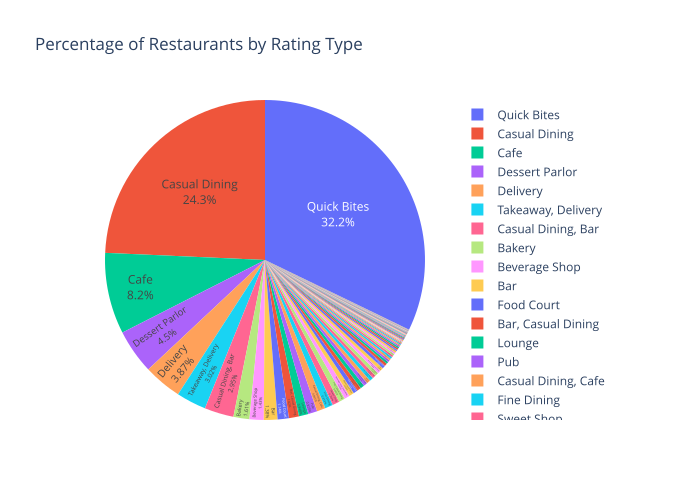

In [34]:
fig = px.pie(rating_type_df, names='rest_type', values='name', color='rest_type',
             title='Percentage of Restaurants by Rating Type').update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Q3) Which are the Top 10 highest rated Seafood Restaurant in Mumbai?

In [35]:
seafood_df = zomato_df[zomato_df['cuisines'].str.contains('Seafood')]
#seafood_df.sort_values(by='rate',ascending=False).head(10)

In [36]:
def clean_rate(value):
    if isinstance(value, str) and '/' in value:
        parts = value.split('/')
        if len(parts) >= 2:
            return float(parts[0])
    try:
        return float(value)
    except ValueError:
        return None  # or another value to indicate missing data

seafood_df['cleaned_rate'] = seafood_df['rate'].apply(clean_rate)

highest_rated_df = seafood_df[seafood_df['cleaned_rate'] >= 4.5]
highest_rated_df


C:\Users\Muthu K\AppData\Local\anaconda3\envs\aiml\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),cleaned_rate
2241,"1231/35/2, 24th Main, 7th Phase, Opposite Brig...",Hakuna Matata,No,No,4.5,2781,+91 9741133866\r\n+91 9880548165,JP Nagar,"Casual Dining, Bar","Mocktails, Cocktails, Appam, Paneer Satay, Sea...","North Indian, Asian, Seafood, Chinese","1,200","[('Rated 3.0', ""RATED\n Heard so much about t...",[],Dine-out,4.5
2246,"77B, 2nd Cross, 3rd Main, 4th Phase, JP Nagar,...",Hunger Camp,No,Yes,4.6,311,080 45128824,JP Nagar,Casual Dining,"Tandoori Chicken, Chicken Sukha, Chicken Birya...","North Indian, South Indian, Chinese, Seafood","1,300","[('Rated 1.0', 'RATED\n The worst experience ...",[],Dine-out,4.6
2469,"1231/35/2, 24th Main, 7th Phase, Opposite Brig...",Hakuna Matata,No,No,4.5,2781,+91 9741133866\r\n+91 9880548165,JP Nagar,"Casual Dining, Bar","Mocktails, Cocktails, Appam, Paneer Satay, Sea...","North Indian, Asian, Seafood, Chinese","1,200","[('Rated 3.0', ""RATED\n Heard so much about t...",[],Drinks & nightlife,4.5
3444,"52, 1st Floor, 33rd Cross, 4th Block, Jayanaga...",Meghana Foods,Yes,No,4.5,4569,080 49652467,Jayanagar,Casual Dining,"Chicken Boneless Biryani, Hyderabadi Biryani, ...","Biryani, Andhra, North Indian, Seafood",600,"[('Rated 4.0', 'RATED\n meghana biriyani shou...",[],Dine-out,4.5
3924,"71/1A, 1st Floor, Kaikondrahalli, Sarjapur Mai...",Suryawanshi,Yes,Yes,4.5,125,080 48667798\r\n+91 9886934036,Sarjapur Road,Casual Dining,"Misal Pav, Chicken Chatpata, Shrikhand, Puran ...","Maharashtrian, Seafood",700,"[('Rated 4.0', 'RATED\n A quaint little place...",[],Delivery,4.5
4822,"71/1A, 1st Floor, Kaikondrahalli, Sarjapur Mai...",Suryawanshi,Yes,Yes,4.5,125,080 48667798\r\n+91 9886934036,Sarjapur Road,Casual Dining,"Misal Pav, Chicken Chatpata, Shrikhand, Puran ...","Maharashtrian, Seafood",700,"[('Rated 4.0', 'RATED\n A quaint little place...",[],Dine-out,4.5
6055,"Gateway Hotel, 66, Residency Road, Bangalore",Karavalli - The Gateway Hotel,No,Yes,4.5,674,+91 9538638137\r\r\n+91 9886643495,Residency Road,Fine Dining,"Appam, Fish, Sea Food, Cocktails, Prawn, Thali...","Mangalorean, Konkan, Seafood, Kerala","3,500","[('Rated 5.0', 'RATED\n The best restaurant f...",[],Dine-out,4.5
10877,"115, 3rd Floor, Opposite Raheja Arcade, Korama...",Fenny's Lounge And Kitchen,No,Yes,4.5,6348,080 49653085,Koramangala 7th Block,"Bar, Casual Dining","Caramel Pudding, Cocktails, Pizza, Mocktails, ...","Mediterranean, Pizza, Continental, Seafood, Salad","1,600","[('Rated 4.0', 'RATED\n I visited this place ...",[],Dine-out,4.5
10887,"77B, 2nd Cross, 3rd Main, 4th Phase, JP Nagar,...",Hunger Camp,No,Yes,4.6,319,080 45128824,JP Nagar,Casual Dining,"Tandoori Chicken, Chicken Sukha, Chicken Birya...","North Indian, South Indian, Chinese, Seafood","1,300","[('Rated 1.0', 'RATED\n The worst experience ...",[],Dine-out,4.6
11457,"115, 3rd Floor, Opposite Raheja Arcade, Korama...",Fenny's Lounge And Kitchen,No,Yes,4.5,6348,080 49653085,Koramangala 7th Block,"Bar, Casual Dining","Caramel Pudding, Cocktails, Pizza, Mocktails, ...","Mediterranean, Pizza, Continental, Seafood, Salad","1,600","[('Rated 4.0', 'RATED\n I visited this place ...",[],Drinks & nightlife,4.5


## Q4) Which is the best Food Truck in Mumbai?

In [37]:
foodtruck_df = zomato_df[zomato_df['cuisines'] == 'Food Truck']
foodtruck_df.sort_values(by='rate',ascending=False).head(2)

,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type)


## Q5) Which places have the highest rated restaurant for each Cuisine Type in Mumbai?

In [38]:
def clean_rate(value):
    if isinstance(value, str) and '/' in value:
        parts = value.split('/')
        if len(parts) >= 2:
            return float(parts[0])
    try:
        return float(value)
    except ValueError:
        return None  # or another value to indicate missing data

zomato_df['cleaned_rate'] = zomato_df['rate'].apply(clean_rate)
highest_rated_df = zomato_df[zomato_df['cleaned_rate'] >= 4.5]
highest_rated_df

,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),cleaned_rate
7,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",Onesta,Yes,Yes,4.6,2556,080 48653961\r\n080 48655715,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600,"[('Rated 5.0', 'RATED\n I personally really l...",[],Cafes,4.6
44,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",Onesta,Yes,Yes,4.6,2556,080 48653961\r\n080 48655715,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600,"[('Rated 5.0', 'RATED\n I personally really l...",[],Delivery,4.6
164,"615/1, Ground Floor, Janardhan Mansion, 10th C...",The Blue Wagon - Kitchen,Yes,No,4.6,228,+91 8105485007\r\n+91 8095904280,Jayanagar,Cafe,"Pizza, Nachos, Garlic Maggi, Burgers, Cheese M...","Cafe, Beverages",400,"[('Rated 5.0', ""RATED\n I've been binging on ...",[],Delivery,4.6
181,"766/25-01, 47th A Cross, Near Sangam Circle, A...",Shakes Theory,Yes,No,4.5,155,+91 9886936896\r\n+91 9620000463,Jayanagar,Beverage Shop,"Sandwiches, Thick Shakes, Paan Shake, Brownie ...","Beverages, Sandwich",300,"[('Rated 5.0', 'RATED\n One of the best place...",[],Delivery,4.5
557,"2469, 3rd Floor, 24th Cross, Opposite BDA Comp...",Onesta,Yes,Yes,4.6,2556,080 48653961\r\r\r\r\n080 48655715,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600,"[('Rated 5.0', 'RATED\n I personally really l...",[],Dine-out,4.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51649,"2, Doddanekkundi, Whitefield Road, Mahadevpura...",Biergarten,No,Yes,4.7,7064,+91 8047096233,Whitefield,"Microbrewery, Pub","Wheat Beer, Risotto, Craft Beer, Caesar Salad,...","Continental, European, BBQ, Chinese, Asian","2,400","[('Rated 3.0', 'RATED\n We had been here on a...",[],Drinks & nightlife,4.7
51650,"331, Road 5B, EPIP Area, Next to KTPO, Whitefi...",Windmills Craftworks,No,No,4.6,5954,+91 8880233322,Whitefield,"Microbrewery, Pub","Keema Pav, Cocktails, Craft Beer, Pork Chops, ...","American, North Indian, Salad","2,500","[('Rated 5.0', ""RATED\n A review for Windmill...",[],Drinks & nightlife,4.6
51682,"HVP Crest, ITPL Main Road, Whitefield, Bangalore",The Pallet,No,Yes,4.5,2745,080 49652944,Whitefield,"Microbrewery, Pub","Craft Beer, Wine, Chilli Chicken, Wedges, Lamb...","Continental, Mediterranean, Italian, North Ind...","1,600","[('Rated 2.0', 'RATED\n We visited this place...",[],Pubs and bars,4.5
51685,"2, Doddanekkundi, Whitefield Road, Mahadevpura...",Biergarten,No,Yes,4.7,7064,+91 8047096233,Whitefield,"Microbrewery, Pub","Wheat Beer, Risotto, Craft Beer, Caesar Salad,...","Continental, European, BBQ, Chinese, Asian","2,400","[('Rated 3.0', 'RATED\n We had been here on a...",[],Pubs and bars,4.7


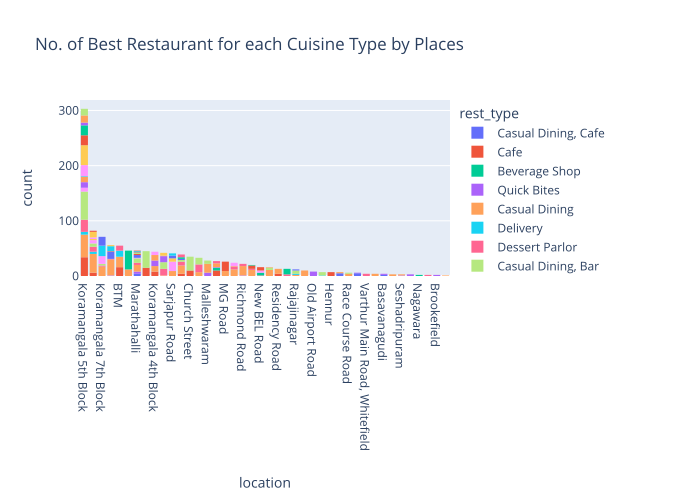

In [39]:
import plotly.express as px

fig = px.histogram(highest_rated_df, x='location', color='rest_type',
                   title='No. of Best Restaurant for each Cuisine Type by Places')
fig.update_xaxes(categoryorder="total descending")
fig.show()


### Q6) What is the Avg Price Distibution of highest rated restaurant for each Cuisine Type in Mumbai?


In [40]:
# Clean 'approx_cost(for two people)' column
def clean_cost(value):
    try:
        return float(value.replace(',', ''))
    except ValueError:
        return None  # or another value to indicate missing or invalid data

highest_rated_df['cleaned_cost'] = highest_rated_df['approx_cost(for two people)'].apply(clean_cost)

# Calculate mean cost per location and cuisine
highest_rated_price_df = highest_rated_df.groupby(by=['location', 'cuisines'])['cleaned_cost'].mean().reset_index()
highest_rated_price_df.head()


C:\Users\Muthu K\AppData\Local\anaconda3\envs\aiml\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,location,cuisines,cleaned_cost
0,BTM,"Cafe, Continental, Burger",900.0
1,BTM,"Continental, Mexican, Chinese, North Indian",800.0
2,BTM,"Desserts, Beverages",400.0
3,BTM,"European, Mediterranean, North Indian, BBQ",1600.0
4,BTM,"Healthy Food, North Indian, Biryani, Continent...",500.0


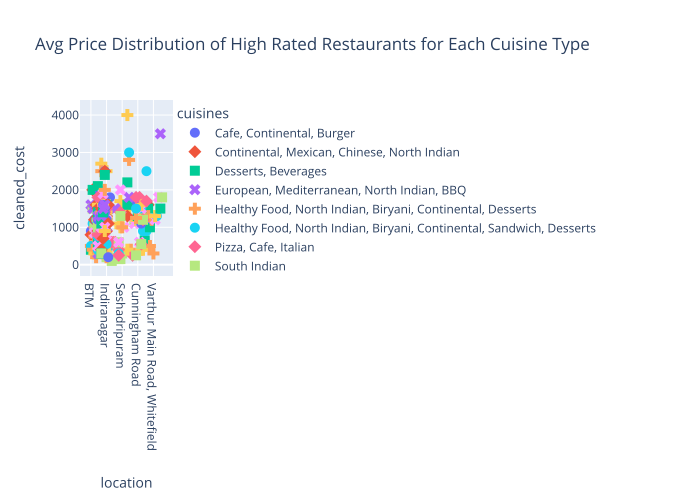

In [41]:
# Create the scatter plot
fig = px.scatter(highest_rated_price_df, x="location", y="cleaned_cost", color="cuisines", symbol="cuisines",
                 title='Avg Price Distribution of High Rated Restaurants for Each Cuisine Type').update_traces(marker_size=10)
fig.show()


### Q7) Which areas have a large number of Chinese Restaurant Market?

In [42]:
chinese_df = zomato_df[zomato_df['cuisines'].str.contains('Chinese')]
chinese_df


,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),cleaned_rate
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,4.1
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,4.1
6,"19/1, New Timberyard Layout, Beside Satellite ...",Rosewood International Hotel - Bar & Restaurant,No,No,3.6,8,+91 9731716688\r\n080 26740366,Mysore Road,Casual Dining,NA,"North Indian, South Indian, Andhra, Chinese",800,"[('Rated 5.0', 'RATED\n Awesome food ??Great ...",[],Buffet,3.6
12,"6th Block, 3rd Stage, Banashankari, Bangalore",The Coffee Shack,Yes,Yes,4.2,164,+91 9731644212,Banashankari,Cafe,"Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sa...","Cafe, Chinese, Continental, Italian",500,"[('Rated 4.0', ""RATED\n Food - 4/5\nAmbience ...",[],Cafes,4.2
16,"241, 4th Floor, 100 Feet Ring Road, Opposite K...",Catch-up-ino,Yes,No,3.9,133,+91 9972988038\r\n+91 9900121238,Banashankari,Cafe,"Momos, Mushroom Bruschettas, Jalapeno Cheeseba...","Cafe, Fast Food, Continental, Chinese, Momos",800,"[('Rated 1.0', ""RATED\n This place is right o...",[],Cafes,3.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51697,"Level 2, Phoenix Marketcity, Mahadevpura, Whit...",Shizusan Shophouse & Bar,Yes,Yes,4.4,1313,080 67266655\n080 49626655,Whitefield,"Casual Dining, Bar","California Roll, Cocktails, Mocktails, Maki Ro...","Asian, Japanese, Vietnamese, Korean, Chinese, ...","1,800","[('Rated 3.0', 'RATED\n Wanted to try this pl...",[],Pubs and bars,4.4
51701,"Unit 4A - 4B, Upper Ground Floor, VR Bengaluru...",The Beer Cafe,Yes,Yes,4.1,673,+91 8929188573,Whitefield,Pub,"Cocktails, Wheat Beer, Bruschettas, Pasta, Bur...","Finger Food, North Indian, Chinese, Italian","1,400","[('Rated 2.0', ""RATED\n We went out to this p...",[],Pubs and bars,4.1
51704,"2nd Floor, Phoenix Market City, Whitefield, Ba...",Smaaash,No,Yes,4,189,+91 9900069474\n+91 7899644468,Whitefield,"Casual Dining, Pub","Pizza, Beer","North Indian, Pizza, Chinese","1,500","[('Rated 3.0', 'RATED\n Like this place for z...",[],Pubs and bars,4.0
51708,"Keys Hotel, 6, 1st Phase Industrial Area, Near...",Keys Cafe - Keys Hotel,No,No,2.8,161,080 39451000\n+91 8884038484,Whitefield,"Casual Dining, Bar","Salads, Coffee, Breakfast Buffet, Halwa, Chick...","Chinese, Continental, North Indian","1,200","[('Rated 3.0', 'RATED\n Place is good not tha...",[],Pubs and bars,2.8


In [43]:
# Clean 'approx_cost(for two people)' column
def clean_cost(value):
    try:
        return float(value.replace(',', ''))
    except ValueError:
        return None  # or another value to indicate missing or invalid data

chinese_df['cleaned_cost'] = chinese_df['approx_cost(for two people)'].apply(clean_cost)

# Group by 'location' and aggregate columns 'name' and 'cleaned_cost'
chinese_rest_df = chinese_df.groupby(by='location').agg({'name': 'count', 'cleaned_cost': 'mean'}).rename(columns={'name': 'COUNT OF RESTAURANTS', 'cleaned_cost': 'AVERAGE PRICE'}).reset_index()

chinese_rest_df = chinese_rest_df.sort_values('COUNT OF RESTAURANTS', ascending=False).head(25)
chinese_rest_df.head()


C:\Users\Muthu K\AppData\Local\anaconda3\envs\aiml\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,location,COUNT OF RESTAURANTS,AVERAGE PRICE
0,BTM,1163,476.896552
43,Koramangala 5th Block,610,837.913907
53,Marathahalli,559,569.409660
22,HSR,542,542.144177
29,JP Nagar,455,671.208791


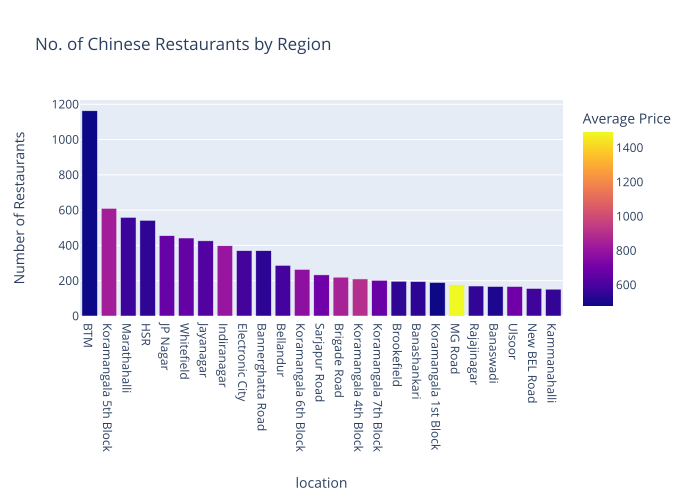

In [44]:
import plotly.express as px

# Assuming chinese_rest_df is your DataFrame containing aggregated Chinese restaurant data

fig = px.bar(chinese_rest_df, x='location', y='COUNT OF RESTAURANTS', color='AVERAGE PRICE',
             title='No. of Chinese Restaurants by Region',
             labels={'COUNT OF RESTAURANTS': 'Number of Restaurants', 'AVERAGE PRICE': 'Average Price'})

fig.show()


## Q8) Is there a relation between Price and Rating by each Cuisine Type?

In [45]:
zomato_df['cleaned_cost'] = zomato_df['approx_cost(for two people)'].apply(clean_cost)

# Group by 'cuisines' and 'rate', and calculate the mean of 'cleaned_cost'
price_rating_df = zomato_df.groupby(['cuisines', 'rate'])['cleaned_cost'].mean().reset_index()

price_rating_df.head()


,cuisines,rate,cleaned_cost
0,"African, Burger",4.5,1000.0
1,"African, Burger",4.6,1000.0
2,"African, Burger, Desserts, Beverages, Fast Food",4.6,1000.0
3,American,2.7,500.0
4,American,2.8,500.0


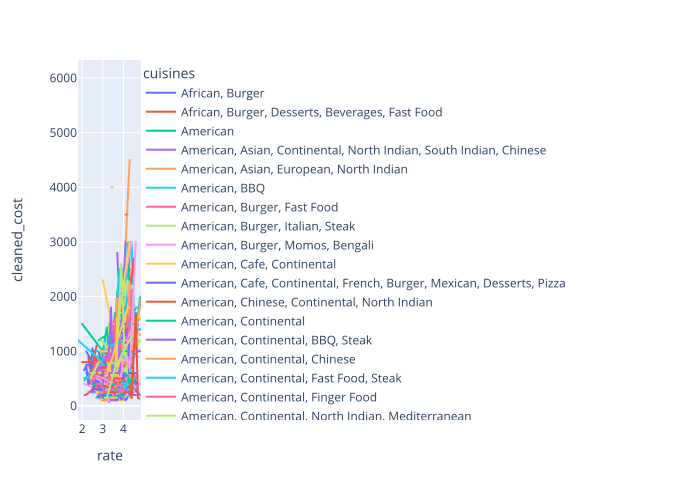

In [46]:
fig = px.line(price_rating_df, y="cleaned_cost", x="rate", color='cuisines')
fig.show()


## Q9) Is there a relation between Region and Price?


In [47]:
zomato_df['cleaned_cost'] = zomato_df['approx_cost(for two people)'].apply(clean_cost)

# Drop rows with missing or non-numeric values
zomato_df = zomato_df.dropna(subset=['cleaned_cost'])

# Group by 'location' and calculate the mean of 'cleaned_cost'
region_price_df = zomato_df.groupby(['location'])['cleaned_cost'].mean().reset_index()

region_price_df.head()

,location,cleaned_cost
0,BTM,435.897177
1,Banashankari,456.967213
2,Banaswadi,447.277228
3,Bannerghatta Road,489.506770
4,Basavanagudi,368.061224


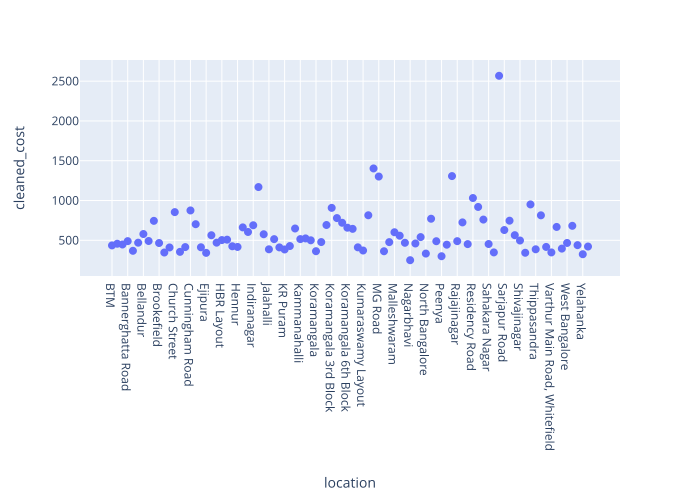

In [48]:
fig = px.scatter(region_price_df, x="location", y="cleaned_cost").update_traces(marker_size=8)
fig.show()


## Q10) Find the list of Affordable Restaurants?
The criteria for Affordable Restaurants would be:-
1) Low Price 2) High Rated
First step will be to find the restaurants with average cost 1/4th the average cost of most expensive restaurant in our dataframe.
Let me explain:-The most expensive restaurant has an average meal cost= 6000. We'll try to stay economical and only pick the
restaurants that are 1/4th of 6000.

In [49]:
#zomato_df['cleaned_cost'] = zomato_df[''name', 'cleaned_cost', 'cuisines', 'location''name', 'cleaned_cost', 'cuisines', 'location''name', 'cleaned_cost', 'cuisines', 'location''name', 'cleaned_cost', 'cuisines', 'location''name', 'cleaned_cost', 'cuisines', 'location''].apply(clean_cost)

# Drop rows with missing or non-numeric values
zomato_df = zomato_df.dropna(subset=['cleaned_cost'])

# Calculate max price and one-fourth price
max_price = zomato_df['cleaned_cost'].max()
one_fourth_price = max_price / 4

print("Max Price:", max_price)
print("One-Fourth Price:", one_fourth_price)

Max Price: 6000.0
One-Fourth Price: 1500.0


In [50]:
# Finding list of restaurants that have price less than and equal to 1/4th of the max price i.e Finding Cheap Restauran
aff_rest_df = zomato_df[['name', 'cleaned_cost', 'cuisines', 'location']]
aff_rest_df = aff_rest_df[aff_rest_df['cleaned_cost'] <= 1250]
aff_rest_df.sort_values(by='cleaned_cost', inplace=True)
aff_rest_df

,name,cleaned_cost,cuisines,location
27091,Srinidhi Sagar Deluxe,40.0,"South Indian, North Indian, Chinese",Domlur
18891,Srinidhi Sagar Food Line,40.0,"South Indian, North Indian, Chinese",Indiranagar
14819,Srinidhi Sagar Food Line,40.0,"South Indian, North Indian, Chinese",Indiranagar
12232,Srinidhi Sagar Food Line,40.0,"South Indian, North Indian, Chinese",Indiranagar
17773,Srinidhi Sagar,40.0,"South Indian, North Indian, Chinese",Old Airport Road
...,...,...,...,...
43054,Fabelle Chocolate Boutique - ITC Gardenia,1250.0,"Desserts, Ice Cream, Beverages",Richmond Road
44159,Havelli - Chairman's Resort,1250.0,"North Indian, Continental, Chinese, Seafood",Sahakara Nagar
38456,Fabelle Chocolate Boutique - ITC Gardenia,1250.0,"Desserts, Ice Cream, Beverages",Richmond Road
28931,Indigo X II P,1250.0,"Finger Food, Continental, Pizza, Asian, North ...",HSR


In [51]:
zomato_df.rename(columns={'rate': 'rating'}, inplace=True)

In [52]:
zomato_df

,address,name,online_order,book_table,rating,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),cleaned_rate,cleaned_cost
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,4.1,800.0
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,4.1,800.0
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,3.8,800.0
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,3.7,300.0
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,3.8,600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51709,"136, SAP Labs India, KIADB Export Promotion In...",The Farm House Bar n Grill,No,No,3.7,34,+91 9980121279\n+91 9900240646,Whitefield,"Casual Dining, Bar",NA,"North Indian, Continental",800,"[('Rated 4.0', 'RATED\n Ambience- Big and spa...",[],Pubs and bars,3.7,800.0
51711,"139/C1, Next To GR Tech Park, Pattandur Agraha...",Bhagini,No,No,2.5,81,080 65951222,Whitefield,"Casual Dining, Bar","Biryani, Andhra Meal","Andhra, South Indian, Chinese, North Indian",800,"[('Rated 4.0', 'RATED\n A fine place to chill...",[],Pubs and bars,2.5,800.0
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,080 40301477,Whitefield,Bar,NA,Continental,"1,500","[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,3.6,1500.0
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500","[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,4.3,2500.0


In [53]:
highrate_rest_df = zomato_df[['name','cuisines', 'location']]
highrate_rest_df = highrate_rest_df[highrate_rest_df['rating'] >= 4.5]
highrate_rest_df.sort_values(by='approx_cost(for two people)', inplace=True)
highrate_rest_df


KeyError: 'rating'

Now, we'll merge the aff_rest_df with highrate_rest_df to obtain the intersection i.e the list of Affordable Restaurants !!


In [70]:
highrate_aff_df = pd.merge(aff_rest_df, highrate_rest_df, how='inner', on=['name', 'location'])
highrate_aff_df = highrate_aff_df[['name', 'location']]
highrate_aff_df.rename(columns={'name':'NAME', 'approx_cost(for two people)':'PRICE', 'cuisines':'CUSINE_CATEGORY',
 'location':'REGION'},inplace=True)

In [71]:
# Affordable Restaurants with low price and high rating 
highrate_aff_df


,NAME,REGION
0,Srinidhi Sagar Deluxe,Domlur
1,Srinidhi Sagar Deluxe,Domlur
2,Srinidhi Sagar Deluxe,Domlur
3,Srinidhi Sagar Deluxe,Domlur
4,Srinidhi Sagar Food Line,Indiranagar
...,...,...
192037,Fabelle Chocolate Boutique - ITC Gardenia,Richmond Road
192038,Fabelle Chocolate Boutique - ITC Gardenia,Richmond Road
192039,Havelli - Chairman's Resort,Sahakara Nagar
192040,Indigo X II P,HSR


## Q10) Find the list of most Reliable Restaurants?
The criteria for most Reliable Restaurants would be:-
1) Low Price 2) High Rated 3) Large No. of Votes
First step will be to find the restaurants with Votes greater than Mean of Votes 

In [72]:
mean_votes = zomato_df['votes'].mean()
mean_votes

398.4423359728507

In [73]:
# Finding list of restaurants that have Votes greater than and equal to Mean of Vote
mean_rest_df = zomato_df[['name', 'approx_cost(for two people)', 'cuisines', 'location', 'votes']]
mean_rest_df = mean_rest_df[mean_rest_df['votes'] > 177]
mean_rest_df.sort_values(by='votes', inplace=True)
mean_rest_df

,name,approx_cost(for two people),cuisines,location,votes
40984,nu.tree,400,"North Indian, Healthy Food, Beverages",Whitefield,178
38748,Lotus Pavilion - ITC Gardenia,"3,000",Continental,Richmond Road,178
38707,Roomali,"1,300",North Indian,Church Street,178
10601,Zeeshan,700,"North Indian, Mughlai, Biryani, Rolls",BTM,178
2891,New Punjabi Hotel,400,"North Indian, Chinese",BTM,178
...,...,...,...,...,...
4801,Byg Brewski Brewing Company,"1,600","Continental, North Indian, Italian, South Indi...",Sarjapur Road,16345
4944,Byg Brewski Brewing Company,"1,600","Continental, North Indian, Italian, South Indi...",Sarjapur Road,16345
49627,Byg Brewski Brewing Company,"1,600","Continental, North Indian, Italian, South Indi...",Sarjapur Road,16832
49170,Byg Brewski Brewing Company,"1,600","Continental, North Indian, Italian, South Indi...",Sarjapur Road,16832


### These are the most reliable, highest rated and affordable restaurants:-
We obtain this dataframe by simply taking the intersection of highrate_aff_df & mean_rest_df
This dataframe obtained below shows the restaurants whose:
Cost is below 1250
Rating is above 4.5
Votes are above 177

In [79]:
# Merge the DataFrames based on 'NAME' and 'REGION'
reliable_rest_df = pd.merge(mean_rest_df, highrate_aff_df, 
                            how='inner', left_on=['NAME', 'REGION'], right_on=['NAME', 'REGION'])

# Select specific columns after the merge
reliable_rest_df = reliable_rest_df[['NAME', 'approx_cost(for two people)', 'CUISINE_CATEGORY', 'REGION']]

# Rename columns
reliable_rest_df.rename(columns={'approx_cost(for two people)': 'PRICE'}, inplace=True)

KeyError: 'NAME'

In [80]:
reliable_rest_df

,NAME,PRICE,CUSINE_CATEGORY,REGION
0,nu.tree,400,"North Indian, Healthy Food, Beverages",Whitefield
1,nu.tree,400,"North Indian, Healthy Food, Beverages",Whitefield
2,nu.tree,400,"North Indian, Healthy Food, Beverages",Whitefield
3,nu.tree,400,"North Indian, Healthy Food, Beverages",Whitefield
4,nu.tree,400,"North Indian, Healthy Food, Beverages",Whitefield
...,...,...,...,...
843549,Truffles,900,"Cafe, American, Burger, Steak",Koramangala 5th Block
843550,Truffles,900,"Cafe, American, Burger, Steak",Koramangala 5th Block
843551,Truffles,900,"Cafe, American, Burger, Steak",Koramangala 5th Block
843552,Truffles,900,"Cafe, American, Burger, Steak",Koramangala 5th Block
